In [1]:
import tensorflow as tf
import pandas as pd

print("TensorFlow Version:", tf.__version__)
print("GPU Devices:", tf.config.list_physical_devices('GPU'))


TensorFlow Version: 2.11.0
GPU Devices: []


In [2]:
test_res = pd.read_csv('S:/Master/data/vargrad/prediction_test.csv')
selected = pd.read_csv('S:/Master/data/vargrad/prediction_test.csv')

df = pd.merge(selected, test_res, 'inner', 'patient_idx')

In [3]:
df.head()

,patient_idx,Level 1_x,Level 2_x,Level 3_x,y_1_x,y_2_x,y_3_x,Level 1_y,Level 2_y,Level 3_y,y_1_y,y_2_y,y_3_y
0,2274.0,0.003797,0.993809,0.002394,1.0,0.0,0.0,0.003797,0.993809,0.002394,1.0,0.0,0.0
1,2279.0,0.998220,0.001729,0.000050,1.0,0.0,0.0,0.998220,0.001729,0.000050,1.0,0.0,0.0
2,2287.0,0.011183,0.959004,0.029813,1.0,0.0,0.0,0.011183,0.959004,0.029813,1.0,0.0,0.0
3,2296.0,0.466927,0.532778,0.000296,1.0,0.0,0.0,0.466927,0.532778,0.000296,1.0,0.0,0.0
4,2312.0,0.991277,0.008269,0.000454,1.0,0.0,0.0,0.991277,0.008269,0.000454,1.0,0.0,0.0


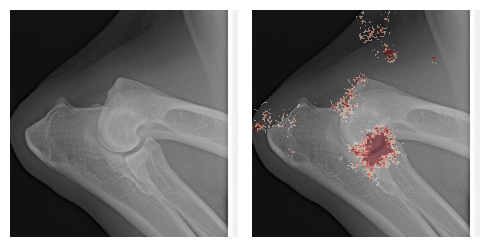

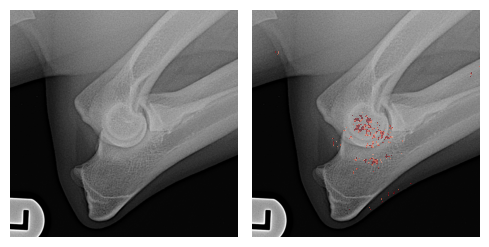

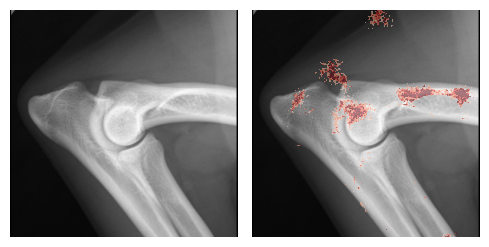

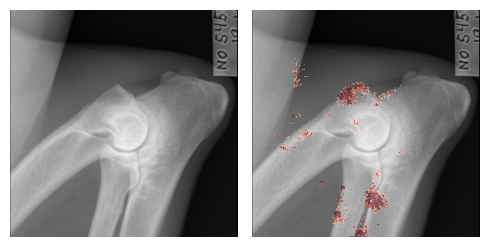

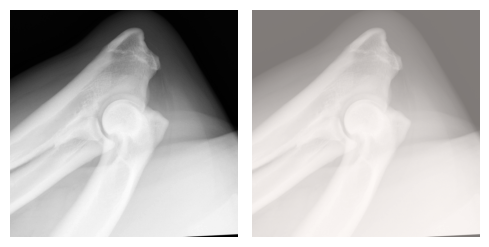

...

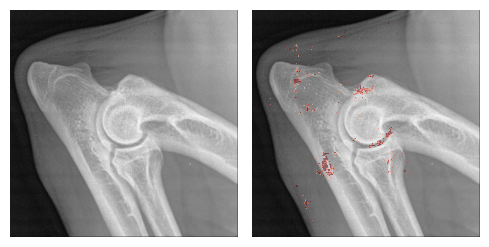

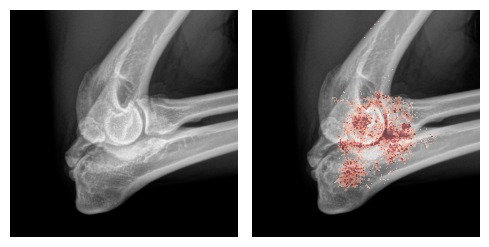

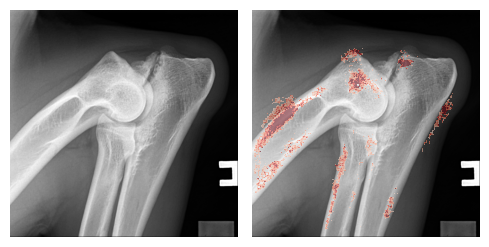

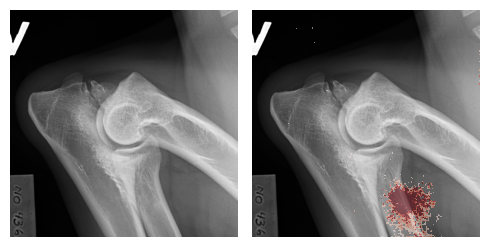

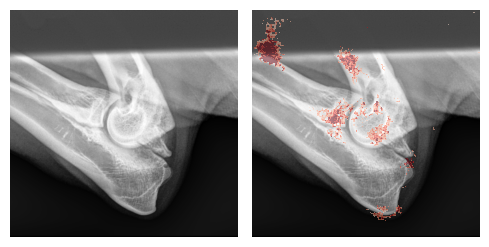

In [8]:
import numpy as np
import h5py
import pandas as pd
import gc
from matplotlib import pyplot as plt
import os


images = np.load('C:/Master/selected.npy')
selected_vargrad = np.load('C:/Master/selected_var_grad_v2.npy')[0]

for i in range(len(images)):
    img = images[i]
    
    fig = plt.figure(figsize=(5, 12))
    
    ax = plt.subplot(1, 2, 1)
    ax.imshow(img, 'gray')
    ax.axis('off')

    ax = plt.subplot(1, 2, 2)
    explain_map = selected_vargrad[i].mean(axis=-1).copy()
    vmax = np.quantile(explain_map, 0.99)
    vmin = np.quantile(explain_map, 0.)  # explain_map.min()
    thres = np.quantile(explain_map, 0.7)
    explain_map[explain_map < thres] = np.nan
    ax.axis('off')
    ax.imshow(img[..., 0], 'gray')
    ax.imshow(explain_map, 'Reds', alpha=0.5, vmin=vmin, vmax=vmax)

    plt.tight_layout()
    plt.show()

In [3]:
selected_vargrad.shape

(1, 246, 800, 800, 3)

In [4]:
images.shape

(246, 800, 800, 1)